# Hannah Zhao - Final Presentation
## ran first MIL with slices! showed significant increase in performance 

In [1]:
# Standard library imports
import os
import re
import random
import shutil
from datetime import datetime
from collections import OrderedDict

# Data handling and visualization libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch and TorchVision libraries for deep learning
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
import torchvision.models as models
from torchvision import transforms, datasets
from PIL import Image

# Scikit-Learn for evaluation metrics and data splitting|
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Imbalanced-learn for oversampling to address class imbalance
from imblearn.over_sampling import RandomOverSampler

from torchvision import transforms
from torchvision.transforms import functional as F
from PIL import Image
from PIL import Image
from PIL import UnidentifiedImageError
from tqdm import tqdm

import os, re, random
from collections import defaultdict, Counter
from sklearn.model_selection import train_test_split

In [2]:
# Define local file paths

# Define your Desktop folder based on your OS; this uses the user's home directory.
desktop = os.path.join(os.path.expanduser("~"), "Desktop")

# Path to the filtered patches folder on your Desktop
filtered_patches_dir = os.path.join(desktop, "uni", "STAT 390", "Hannah Zhao", "CMIL_SP2025_Patches_Apr27")

# Path to the CSV file inside Desktop/uni/STAT 390/Hannah Zhao
csv_file_path = os.path.join(desktop, "uni", "STAT 390", "Hannah Zhao", "case_grade_match.csv")

# Directory to store model checkpoints
checkpoint_dir = os.path.join(desktop, "uni", "STAT 390", "Hannah Zhao", "Checkpoints")
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist

# load labels 
labels = pd.read_csv(csv_file_path)

In [3]:
# === Slice-Level Grouping ===
def group_patches_by_slice(root_dir):
    case_slices = defaultdict(list)
    for root, _, files in os.walk(root_dir):
        for filename in files:
            if filename.endswith(".png"):
                match = re.match(r"case_(\d+)_([a-z]+_\d+)_", filename)
                if match:
                    case_id = int(match.group(1))
                    slice_id = match.group(2)
                    key = (case_id, slice_id)
                    case_slices[key].append(os.path.join(root, filename))
    return case_slices

# === Load Patches by Slice ===
patches = group_patches_by_slice(filtered_patches_dir)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

#adding data augmentation like random crop, flips, rotation

# Training transform (augmented)
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# === Build Label Map by Slice ===
slice_to_class = {}
valid_classes = [1.0, 3.0, 4.0]
for (case_id, slice_id), paths in patches.items():
    raw_label = labels.loc[labels['Case'] == case_id, 'Class']
    if not raw_label.empty and raw_label.item() in valid_classes:
        label = 0 if raw_label.item() == 1.0 else 1
        slice_to_class[(case_id, slice_id)] = label

# === Stratified Split by Slice ===
slices_by_class = defaultdict(list)
for key, label in slice_to_class.items():
    slices_by_class[label].append(key)

train_slices, val_slices, test_slices = [], [], []
for label, slice_keys in slices_by_class.items():
    train, temp = train_test_split(slice_keys, test_size=0.4, random_state=42)
    val, test = train_test_split(temp, test_size=0.5, random_state=42)
    train_slices += train
    val_slices += val
    test_slices += test

train_patches = {k: patches[k] for k in train_slices}
val_patches   = {k: patches[k] for k in val_slices}
test_patches  = {k: patches[k] for k in test_slices}

# === Filter to H&E Only ===

def filter_by_stain(d, keyword):
    out, dropped = {}, []
    for k, paths in d.items():
        filtered = [p for p in paths if keyword.lower() in os.path.basename(p).lower()]
        if filtered:
            out[k] = filtered
        else:
            dropped.append(k)
    if dropped:
        print(f"⚠️ Dropped slices with no '{keyword}' patches: {dropped}")
    return out


train_patches = filter_by_stain(train_patches, "h&e")
val_patches   = filter_by_stain(val_patches, "h&e")
test_patches  = filter_by_stain(test_patches, "h&e")

⚠️ Dropped slices with no 'h&e' patches: [(38, 'match_28'), (50, 'match_4'), (38, 'match_29'), (38, 'match_27'), (58, 'match_1'), (50, 'match_5')]
⚠️ Dropped slices with no 'h&e' patches: [(38, 'match_22')]


In [4]:
# just a way of grouping all the patches into a case data point, so to output each sample as a 4d tensor shape containing
# the number of patches, number of channels, and size, and also the case label

# === MILDataset with slice-level keys ===
class SliceMILDataset(Dataset):
    def __init__(self, patch_dict, label_map, transform=None, emergency_cap=800):
        self.transform = transform
        self.emergency_cap = emergency_cap
        self.bags, self.labels = [], []
        for slice_key, paths in patch_dict.items():
            if slice_key in label_map:
                self.bags.append(paths)
                self.labels.append(label_map[slice_key])

    def __len__(self): return len(self.bags)

    def __getitem__(self, idx):
        paths = self.bags[idx]
        imgs = []
        for p in paths:
            try:
                img = Image.open(p).convert('RGB')
                if self.transform:
                    img = self.transform(img)
                imgs.append(img)
            except:
                continue
        if len(imgs) == 0:
            raise ValueError(f"No usable patches in slice {paths}")
        if self.emergency_cap and len(imgs) > self.emergency_cap:
            imgs = random.sample(imgs, self.emergency_cap)
        return torch.stack(imgs), torch.tensor(self.labels[idx], dtype=torch.long)


# this pools the patch level features into single bag level representation for MIL
class AttentionPool(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super().__init__()
        # creates small neural network to compute attention scores for each patch 
        # each patch embedding is passed through a linear layer, tanh for nonlinearity, and another linear layer to get a scalar score
        self.attention = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x, return_weights=False):
        # x is of shape (B, M, D) where B is batch size or number of cases, 
        # M is number of patches per bag, and D is the embedding dimensions for each patch
        weights = self.attention(x)     # (B, M, 1)
        weights = torch.softmax(weights, dim=1)
        # outputs attention scores for each patch and normalized with softmax
        # D is the embedding dimension which is size of feature vector for each patch after going through the patch classifier 
        weighted_x = (weights * x).sum(dim=1)  # (B, D)
        # returning the raw attention weights per patch just to help with visualization of the weights for each patch
        if return_weights:
            return weighted_x, weights.squeeze(-1)  # (B, D), (B, M)
        return weighted_x
    

# using Densenet to extract features at the patch-level, and adaptaive pooling for patch-level feature pooling
# the patch features are passed into Attentionpool which learns the weights across patches and combines them into a single bag label


class AttnMIL(nn.Module):
    def __init__(self, base_model, num_classes=2, embed_dim=512):
        super().__init__()
        # grabbing the convolutional feature extractor from the pretrained model 
        self.features = base_model.features
        # applying adaptive average pooling to compress to feature map of 2x2 grid
        # you get 4 spatial vectors per patch
        self.pool = nn.AdaptiveAvgPool2d((2,2))  # richer than (1,1)
        # meaning that you'll get 4 vectors per patch which will then be flattened
        self.patch_projector = nn.Linear(base_model.classifier.in_features * 4, embed_dim)
        self.attention_pool = AttentionPool(embed_dim)
        self.classifier = nn.Linear(embed_dim, num_classes)
    

    def forward(self, x, return_patch_logits=False, return_attn_weights=False):
        if x.dim() == 4:
            x = x.unsqueeze(0)
        # typically after CNN you get 3D tensor with num channels, height and width of image
        # but we packed the patches into a bag by case (the tensor), so B is batch size, M is number of patches per bag
        B, M, C, H, W = x.shape
        x = x.view(B*M, C, H, W)

        features = self.features(x) # exxtracting cnn features for each patch
        pooled = self.pool(features).view(B*M, -1) # pool each feature map to a 2x2 grid and flatten
        embedded = self.patch_projector(pooled).view(B, M, -1) # project each patch into shared embedding space -- 
        # just ensuring all the patches are transformed into vectors of the same length for attention

        # in order to get patch level predictions 
        if return_patch_logits:
            logits = self.classifier(embedded)  # (B, M, 2)
            return logits
        # returning attention weights for visualization
        if return_attn_weights:
            bag_emb, attn_weights = self.attention_pool(embedded, return_weights=True)
            logits = self.classifier(bag_emb)
            return logits, attn_weights  # bag prediction + per-patch attention scores
        
        # applying attention 
        #computing a weighted average of patch embeddings using attention, and then is passed through the classifier to get bag level prediction
        bag_emb = self.attention_pool(embedded)
        logits = self.classifier(bag_emb)
        return logits


In [5]:
# Set up datasets
# Set up slice-based MIL datasets
train_ds = SliceMILDataset(train_patches, slice_to_class, transform=train_transform)
val_ds   = SliceMILDataset(val_patches, slice_to_class, transform=transform)
test_ds  = SliceMILDataset(test_patches, slice_to_class, transform=transform, emergency_cap=None)

# help generalize better and reduce overfitting
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True)
# don't want to shuffle so taht you get consistent, repeatable evaluation
val_loader   = DataLoader(val_ds, batch_size=1, shuffle=False)
test_loader  = DataLoader(test_ds, batch_size=1, shuffle=False)

In [7]:
import re
from collections import Counter, defaultdict

def summarize_split(patch_dict, label_map=None, split_name=""):
    # Count cases
    num_cases = len(patch_dict)

    # Count total patches
    total_patches = sum(len(paths) for paths in patch_dict.values())

    # Count per class (if label map provided)
    class_counts = Counter()
    if label_map:
        class_counts.update([label_map[c] for c in patch_dict.keys() if c in label_map])

    # Count unique slice IDs (if present in patch filenames)
    slice_set = set()
    for paths in patch_dict.values():
        for path in paths:
            # Extract slice identifier after 2nd underscore (e.g., unmatched_2 from case_01_unmatched_2_patch43.png)
            match = re.search(r"case_\d+_(\w+_\d+)", os.path.basename(path))
            if match:
                slice_set.add(match.group(1))

    # Output
    print(f"\n🔹 {split_name} Split")
    print(f"Cases: {num_cases}")
    print(f"Patches: {total_patches}")
    if class_counts:
        print(f"Class distribution: {dict(class_counts)}")
    print(f"Slices (unique IDs): {len(slice_set)}")

# Run for all splits
summarize_split(train_patches, slice_to_class, split_name="Train")
summarize_split(val_patches, slice_to_class, split_name="Validation")
summarize_split(test_patches, slice_to_class, split_name="Test")


🔹 Train Split
Cases: 73
Patches: 8600
Class distribution: {1: 49, 0: 24}
Slices (unique IDs): 11

🔹 Validation Split
Cases: 26
Patches: 3481
Class distribution: {1: 18, 0: 8}
Slices (unique IDs): 9

🔹 Test Split
Cases: 26
Patches: 2751
Class distribution: {1: 18, 0: 8}
Slices (unique IDs): 8


In [8]:
import pandas as pd

def summarize_patch_distribution(patch_dict, split_name):
    patch_counts = {case: len(patches) for case, patches in patch_dict.items()}
    print(f"\n📦 Patch counts for {split_name}:")
    for case, count in sorted(patch_counts.items()):
        print(f"  Case {case}: {count} patches")

    df = pd.DataFrame(list(patch_counts.items()), columns=["Case", "Patch Count"])
    df.to_csv(f"{split_name.lower()}_patch_counts.csv", index=False)
    return df

# Call for each split
train_df = summarize_patch_distribution(train_patches, "Train")
val_df   = summarize_patch_distribution(val_patches, "Validation")
test_df  = summarize_patch_distribution(test_patches, "Test")



📦 Patch counts for Train:
  Case (1, 'match_1'): 64 patches
  Case (1, 'unmatched_1'): 68 patches
  Case (1, 'unmatched_2'): 74 patches
  Case (2, 'match_1'): 124 patches
  Case (2, 'unmatched_1'): 100 patches
  Case (2, 'unmatched_2'): 114 patches
  Case (2, 'unmatched_3'): 99 patches
  Case (3, 'match_1'): 122 patches
  Case (3, 'unmatched_3'): 192 patches
  Case (4, 'unmatched_1'): 163 patches
  Case (5, 'match_1'): 142 patches
  Case (7, 'unmatched_2'): 117 patches
  Case (9, 'unmatched_2'): 60 patches
  Case (11, 'match_1'): 80 patches
  Case (11, 'unmatched_1'): 95 patches
  Case (11, 'unmatched_2'): 104 patches
  Case (12, 'match_1'): 50 patches
  Case (12, 'unmatched_1'): 104 patches
  Case (12, 'unmatched_2'): 108 patches
  Case (14, 'match_3'): 58 patches
  Case (19, 'match_2'): 209 patches
  Case (28, 'unmatched_4'): 82 patches
  Case (30, 'unmatched_1'): 72 patches
  Case (30, 'unmatched_2'): 97 patches
  Case (32, 'match_1'): 56 patches
  Case (32, 'unmatched_1'): 50 patc

In [10]:
from collections import defaultdict

def count_patches_by_class(patch_dict, case_to_class, split_name):
    class_patch_counts = defaultdict(int)

    for case, patches in patch_dict.items():
        label = case_to_class[case]
        class_patch_counts[label] += len(patches)

    print(f"\n🧬 Patch count by class for {split_name}:")
    print(f"  Benign (0):     {class_patch_counts[0]} patches")
    print(f"  High-grade (1): {class_patch_counts[1]} patches")

    return class_patch_counts

# Count patches per class for each split
train_counts = count_patches_by_class(train_patches, slice_to_class, "Train")
val_counts   = count_patches_by_class(val_patches, slice_to_class, "Validation")
test_counts  = count_patches_by_class(test_patches, slice_to_class, "Test")



🧬 Patch count by class for Train:
  Benign (0):     2596 patches
  High-grade (1): 6004 patches

🧬 Patch count by class for Validation:
  Benign (0):     1245 patches
  High-grade (1): 2236 patches

🧬 Patch count by class for Test:
  Benign (0):     1068 patches
  High-grade (1): 1683 patches


In [12]:
def save_checkpoint(model, arch, checkpoint_dir, optimizer, epoch):
    os.makedirs(checkpoint_dir, exist_ok=True)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{checkpoint_dir}/{timestamp}_{arch}_epoch{epoch}.pth"
    checkpoint = {
        "arch": arch,
        "model_state_dict": model.state_dict(),
        "epoch": epoch,
        "optimizer_state_dict": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)
    print(f"✅ Checkpoint saved: {filename}")

def validation(model, criterion, val_loader):
    val_loss = 0
    correct_total = 0
    sample_total = 0
    model.eval()
    with torch.no_grad():
        for bags, labels in val_loader:
            bags = bags.to(device)
            labels = labels.to(device)
            outputs = model(bags)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * labels.size(0)
            preds = torch.argmax(outputs, dim=1)
            correct_total += (preds == labels).sum().item()
            sample_total += labels.size(0)
    return val_loss / sample_total, correct_total / sample_total

def train_model(model, optimizer, criterion, train_loader, val_loader, arch, checkpoint_dir, epochs=5):
    for epoch in range(epochs):
        model.train()
        running_loss = 0
        for bags, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            bags = bags.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs = model(bags)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        val_loss, val_acc = validation(model, criterion, val_loader)
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {running_loss/len(train_loader):.3f}, Val Loss: {val_loss:.3f}, Val Acc: {val_acc:.3f}")
        save_checkpoint(model, arch, checkpoint_dir, optimizer, epoch+1)
    return model

In [13]:
# ------------------- Load pretrained patch model -------------------
# used for classifiing individual image patches, its convolutional layers are used as frozen feature extractor in MIL
class PatchClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        base = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT)
        # loading the pre trained densenet model
        self.features = base.features
        # compress final convolutional output of each image to 2x2 feature map
        self.pool = nn.AdaptiveAvgPool2d((2,2))
        self.classifier = nn.Linear(base.classifier.in_features * 4, 2)
    
    def forward(self, x):
        # first passes input images through Densenet convolutional layers to get feature maps
        x = self.features(x)
        # applies pooling
        x = self.pool(x).view(x.size(0), -1)
        # passes to final classifier layer to get the logits
        return self.classifier(x)

patch_model = PatchClassifier()
patch_model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "patch_classifier.pth")))
patch_model.eval()

PatchClassifier(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# ------------------- Inject backbone into MIL -------------------
# creating new densenet model with no pretrained weights
base_model = models.densenet121(weights=None)
# replacing its features or convolutional layers with the pretrained ones from the patch classifier that we loaded
base_model.features = patch_model.features

# creating the Attention MIL model using the pretrained feature extractor
model = AttnMIL(base_model=base_model).to(device)
# freezing the feature extractor
for param in model.features.parameters():
    param.requires_grad = False

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
arch = "densenet121_simplemil"


train_loader = DataLoader(train_ds, batch_size=1, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False)

In [15]:
# Train model
trained_model = train_model(
    model=model,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    val_loader=val_loader,
    arch=arch,
    checkpoint_dir=checkpoint_dir,
    epochs=5,
)

Epoch 1/5: 100%|██████████| 74/74 [53:10<00:00, 43.11s/it] 


Epoch 1/5, Train Loss: 1.463, Val Loss: 0.827, Val Acc: 0.600
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250605_193447_densenet121_simplemil_epoch1.pth


Epoch 2/5: 100%|██████████| 74/74 [50:53<00:00, 41.27s/it] 


Epoch 2/5, Train Loss: 0.723, Val Loss: 0.466, Val Acc: 0.800
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250605_204011_densenet121_simplemil_epoch2.pth


Epoch 3/5: 100%|██████████| 74/74 [48:50<00:00, 39.60s/it]  


Epoch 3/5, Train Loss: 0.697, Val Loss: 0.864, Val Acc: 0.680
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250605_214351_densenet121_simplemil_epoch3.pth


Epoch 4/5: 100%|██████████| 74/74 [52:51<00:00, 42.86s/it]  


Epoch 4/5, Train Loss: 0.641, Val Loss: 0.588, Val Acc: 0.600
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250605_225158_densenet121_simplemil_epoch4.pth


Epoch 5/5: 100%|██████████| 74/74 [56:21<00:00, 45.69s/it] 


Epoch 5/5, Train Loss: 0.516, Val Loss: 0.747, Val Acc: 0.720
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250606_000340_densenet121_simplemil_epoch5.pth


=== Case-Level Classification Report ===
                 precision    recall  f1-score   support

         Benign       0.60      0.75      0.67         8
High-grade CMIL       0.87      0.76      0.81        17

       accuracy                           0.76        25
      macro avg       0.73      0.76      0.74        25
   weighted avg       0.78      0.76      0.77        25


=== Patch-Level Classification Report (weak labels) ===
                 precision    recall  f1-score   support

         Benign       0.33      0.72      0.45       682
High-grade CMIL       0.77      0.40      0.52      1647

       accuracy                           0.49      2329
      macro avg       0.55      0.56      0.49      2329
   weighted avg       0.64      0.49      0.50      2329



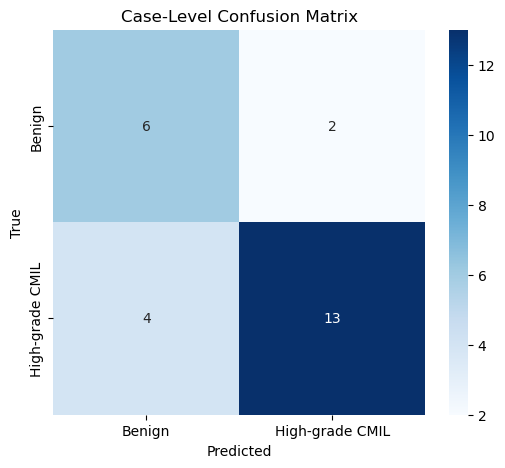

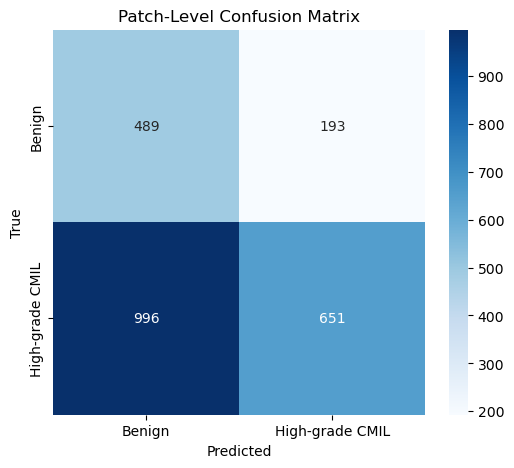

In [16]:
# ------------------- Evaluation -------------------
model.eval()
all_preds, all_trues = [], []
all_patch_preds, all_patch_trues = [], []

with torch.no_grad():
    for X_bag, y in test_loader:
        X_bag, y = X_bag.to(device), y.to(device)

        # Case-level prediction
        bag_logits = model(X_bag)
        bag_pred = bag_logits.argmax(dim=1)
        all_preds.extend(bag_pred.cpu().numpy())
        all_trues.extend(y.cpu().numpy())

        # Patch-level prediction (weak supervision)
        patch_logits = model(X_bag, return_patch_logits=True)
        patch_pred = patch_logits.argmax(dim=2).squeeze(0).cpu().numpy()
        patch_labels = y.cpu().item() * np.ones_like(patch_pred)

        all_patch_preds.extend(patch_pred)
        all_patch_trues.extend(patch_labels)

# Reports
print("=== Slice-Level Classification Report ===")
print(classification_report(all_trues, all_preds, target_names=['Benign', 'High-grade CMIL'], labels=[0,1]))

print("\n=== Patch-Level Classification Report (weak labels) ===")
print(classification_report(all_patch_trues, all_patch_preds, target_names=['Benign', 'High-grade CMIL'], labels=[0,1]))

# Confusion matrices
for name, preds, trues in [
    ("Case-Level", all_preds, all_trues),
    ("Patch-Level", all_patch_preds, all_patch_trues)
]:
    cm = confusion_matrix(trues, preds)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign','High-grade CMIL'],
                yticklabels=['Benign','High-grade CMIL'])
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"{name} Confusion Matrix")
    plt.show()

=== Aggregated Case-Level Classification Report ===
                 precision    recall  f1-score   support

         Benign       0.62      0.71      0.67         7
High-grade CMIL       0.83      0.77      0.80        13

       accuracy                           0.75        20
      macro avg       0.73      0.74      0.73        20
   weighted avg       0.76      0.75      0.75        20



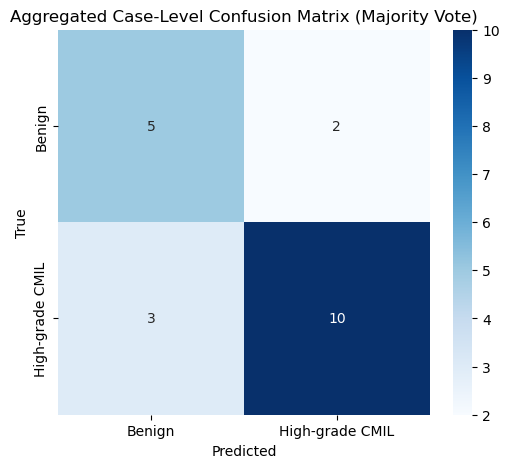

In [21]:
from collections import defaultdict

# Rebuild mapping from test set index to case_id
slice_keys = list(test_patches.keys())  # keys like (case_id, slice_id)

# Store per-slice predictions and truths
case_preds = defaultdict(list)
case_trues = {}

with torch.no_grad():
    for i, (X_bag, y) in enumerate(test_loader):
        X_bag, y = X_bag.to(device), y.to(device)
        logits = model(X_bag)
        pred = logits.argmax(dim=1).item()

        case_id = slice_keys[i][0]  # extract case_id from (case_id, slice_id)
        case_preds[case_id].append(pred)
        case_trues[case_id] = y.item()  # same for all slices of this case

# Majority vote per case
final_preds = []
final_trues = []
for case_id in sorted(case_preds.keys()):
    votes = case_preds[case_id]
    maj_pred = max(set(votes), key=votes.count)
    final_preds.append(maj_pred)
    final_trues.append(case_trues[case_id])

# Report
print("=== Aggregated Case-Level Classification Report ===")
print(classification_report(final_trues, final_preds, target_names=['Benign', 'High-grade CMIL']))

cm = confusion_matrix(final_trues, final_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign','High-grade CMIL'],
            yticklabels=['Benign','High-grade CMIL'])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Aggregated Case-Level Confusion Matrix (Majority Vote)")
plt.show()


In [17]:
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_top_attended_patches(model, test_ds, num_cases=3, top_k=5):
    model.eval()
    selected_indices = random.sample(range(len(test_ds)), num_cases)
    
    for idx in selected_indices:
        bag, label = test_ds[idx]
        bag = bag.unsqueeze(0).to(device)
        label = label.item()

        with torch.no_grad():
            logits, attn_weights = model(bag, return_attn_weights=True)
            pred = logits.argmax(dim=1).item()
            correct = (pred == label)
            attn_weights = attn_weights.squeeze(0).cpu().numpy()

        patch_paths = test_ds.bags[idx]
        top_indices = attn_weights.argsort()[-top_k:][::-1]

        print(f"\n🧪 Case #{idx}: True label = {label}, Predicted = {pred}, Correct = {correct}")
        print("Top patches with highest attention:")

        plt.figure(figsize=(15, 3))
        for i, patch_idx in enumerate(top_indices):
            patch_path = patch_paths[patch_idx]
            img = Image.open(patch_path)
            weight = attn_weights[patch_idx]
            
            print(f"  - {os.path.basename(patch_path)}: attention = {weight:.4f}")

            plt.subplot(1, top_k, i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"attn={weight:.3f}")
        plt.suptitle(f"Case {idx} | True: {label} | Pred: {pred} | Correct: {correct}")
        plt.tight_layout()
        plt.show()



🧪 Case #10: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_32_unmatched_1_h&e_patch32.png: attention = 0.0737
  - case_32_unmatched_1_h&e_patch45.png: attention = 0.0708
  - case_32_unmatched_1_h&e_patch43.png: attention = 0.0465
  - case_32_unmatched_1_h&e_patch47.png: attention = 0.0462
  - case_32_unmatched_1_h&e_patch46.png: attention = 0.0355
  - case_32_unmatched_1_h&e_patch48.png: attention = 0.0339


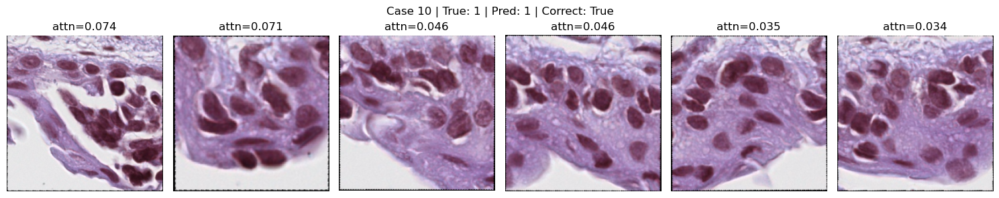


🧪 Case #2: True label = 0, Predicted = 0, Correct = True
Top patches with highest attention:
  - case_36_unmatched_1_h&e_patch51.png: attention = 0.6922
  - case_36_unmatched_1_h&e_patch14.png: attention = 0.0557
  - case_36_unmatched_1_h&e_patch60.png: attention = 0.0319
  - case_36_unmatched_1_h&e_patch58.png: attention = 0.0148
  - case_36_unmatched_1_h&e_patch40.png: attention = 0.0079
  - case_36_unmatched_1_h&e_patch62.png: attention = 0.0052


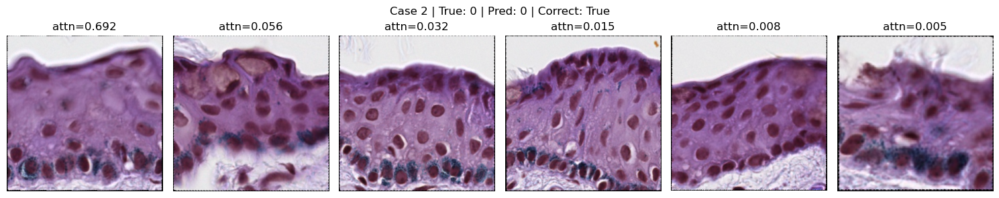


🧪 Case #3: True label = 0, Predicted = 1, Correct = False
Top patches with highest attention:
  - case_86_match_1_h&e_patch65.png: attention = 0.1419
  - case_86_match_1_h&e_patch62.png: attention = 0.0926
  - case_86_match_1_h&e_patch63.png: attention = 0.0919
  - case_86_match_1_h&e_patch58.png: attention = 0.0903
  - case_86_match_1_h&e_patch22.png: attention = 0.0765
  - case_86_match_1_h&e_patch11.png: attention = 0.0701


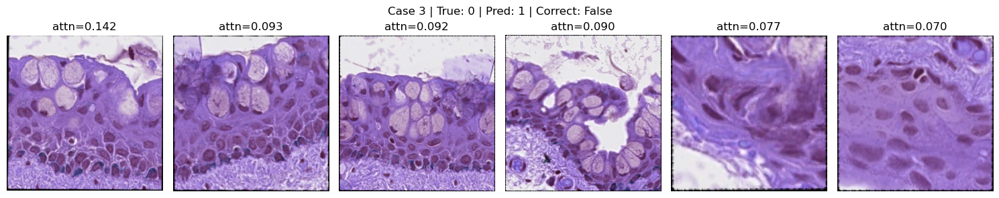


🧪 Case #17: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_40_match_1_h&e_patch14.png: attention = 0.1493
  - case_40_match_1_h&e_patch17.png: attention = 0.0765
  - case_40_match_1_h&e_patch29.png: attention = 0.0742
  - case_40_match_1_h&e_patch7.png: attention = 0.0638
  - case_40_match_1_h&e_patch3.png: attention = 0.0604
  - case_40_match_1_h&e_patch27.png: attention = 0.0584


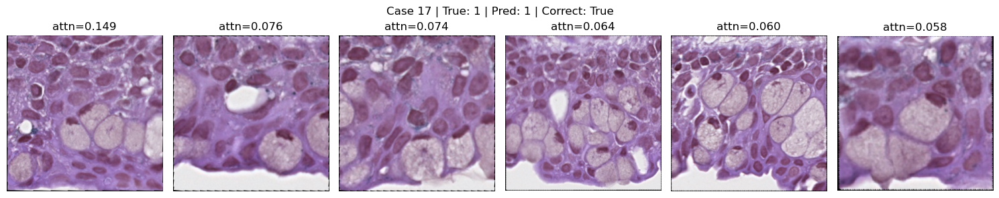


🧪 Case #1: True label = 0, Predicted = 0, Correct = True
Top patches with highest attention:
  - case_2_match_1_h&e_patch96.png: attention = 0.1010
  - case_2_match_1_h&e_patch95.png: attention = 0.0862
  - case_2_match_1_h&e_patch116.png: attention = 0.0591
  - case_2_match_1_h&e_patch99.png: attention = 0.0412
  - case_2_match_1_h&e_patch44.png: attention = 0.0306
  - case_2_match_1_h&e_patch26.png: attention = 0.0304


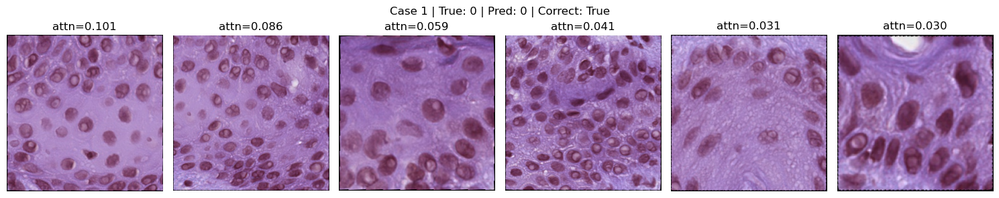


🧪 Case #20: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_32_unmatched_3_h&e_patch26.png: attention = 0.5481
  - case_32_unmatched_3_h&e_patch25.png: attention = 0.1134
  - case_32_unmatched_3_h&e_patch28.png: attention = 0.1008
  - case_32_unmatched_3_h&e_patch34.png: attention = 0.0933
  - case_32_unmatched_3_h&e_patch20.png: attention = 0.0766
  - case_32_unmatched_3_h&e_patch27.png: attention = 0.0264


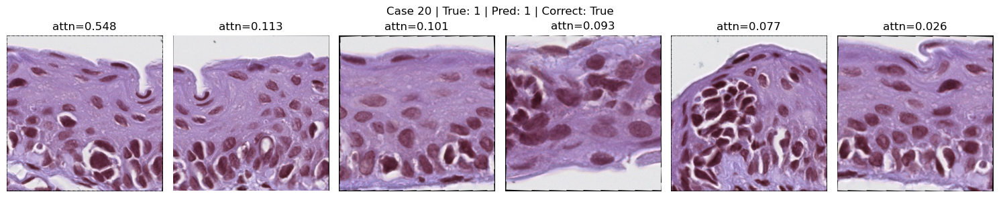


🧪 Case #24: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_38_match_7_h&e_patch26.png: attention = 0.1151
  - case_38_match_7_h&e_patch189.png: attention = 0.0821
  - case_38_match_7_h&e_patch202.png: attention = 0.0746
  - case_38_match_7_h&e_patch25.png: attention = 0.0530
  - case_38_match_7_h&e_patch184.png: attention = 0.0479
  - case_38_match_7_h&e_patch0.png: attention = 0.0429


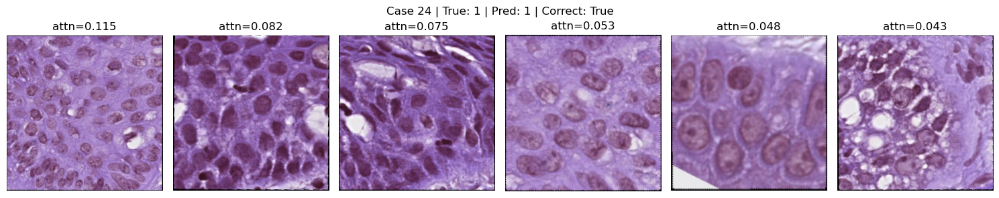


🧪 Case #12: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_97_match_2_h&e_patch85.png: attention = 0.3287
  - case_97_match_2_h&e_patch80.png: attention = 0.1714
  - case_97_match_2_h&e_patch27.png: attention = 0.1644
  - case_97_match_2_h&e_patch87.png: attention = 0.1299
  - case_97_match_2_h&e_patch76.png: attention = 0.0888
  - case_97_match_2_h&e_patch82.png: attention = 0.0363


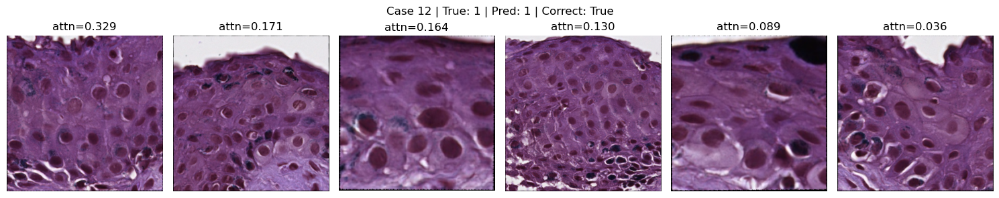


🧪 Case #14: True label = 1, Predicted = 0, Correct = False
Top patches with highest attention:
  - case_5_unmatched_1_h&e_patch34.png: attention = 0.0211
  - case_5_unmatched_1_h&e_patch40.png: attention = 0.0209
  - case_5_unmatched_1_h&e_patch71.png: attention = 0.0208
  - case_5_unmatched_1_h&e_patch38.png: attention = 0.0204
  - case_5_unmatched_1_h&e_patch36.png: attention = 0.0197
  - case_5_unmatched_1_h&e_patch37.png: attention = 0.0188


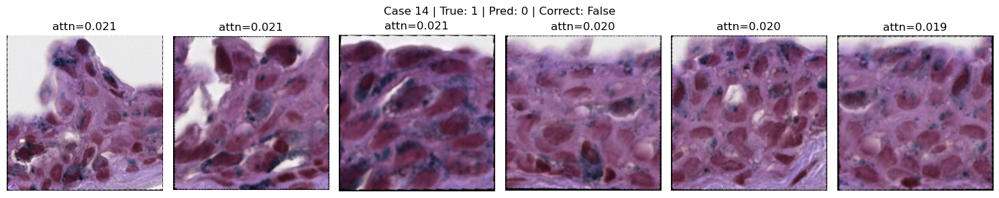


🧪 Case #7: True label = 0, Predicted = 0, Correct = True
Top patches with highest attention:
  - case_2_unmatched_3_h&e_patch77.png: attention = 0.1411
  - case_2_unmatched_3_h&e_patch6.png: attention = 0.1108
  - case_2_unmatched_3_h&e_patch85.png: attention = 0.0799
  - case_2_unmatched_3_h&e_patch82.png: attention = 0.0607
  - case_2_unmatched_3_h&e_patch41.png: attention = 0.0515
  - case_2_unmatched_3_h&e_patch30.png: attention = 0.0466


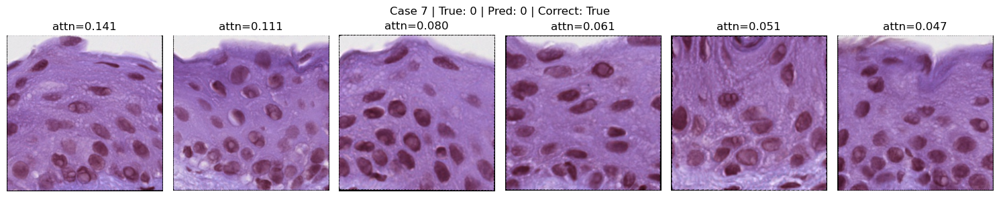


🧪 Case #18: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_38_match_25_h&e_patch10.png: attention = 0.2074
  - case_38_match_25_h&e_patch9.png: attention = 0.2074
  - case_38_match_25_h&e_patch8.png: attention = 0.2074
  - case_38_match_25_h&e_patch5.png: attention = 0.1711
  - case_38_match_25_h&e_patch2.png: attention = 0.1654
  - case_38_match_25_h&e_patch4.png: attention = 0.0298


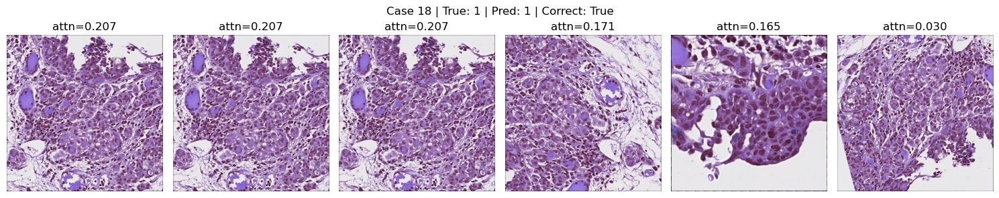


🧪 Case #19: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_14_match_1_h&e_patch28.png: attention = 0.3600
  - case_14_match_1_h&e_patch105.png: attention = 0.2748
  - case_14_match_1_h&e_patch13.png: attention = 0.0716
  - case_14_match_1_h&e_patch5.png: attention = 0.0699
  - case_14_match_1_h&e_patch24.png: attention = 0.0340
  - case_14_match_1_h&e_patch30.png: attention = 0.0253


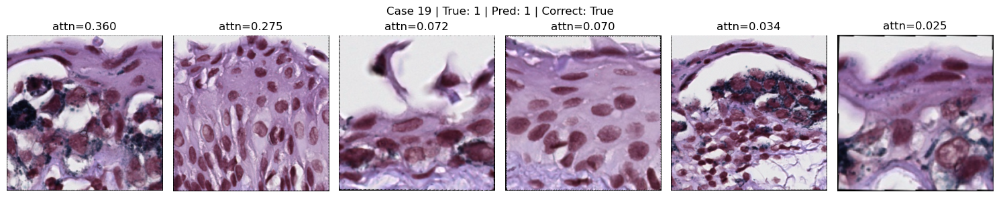

In [18]:
visualize_top_attended_patches(model, test_ds, num_cases=12, top_k=6)

In [19]:
def unnormalize(tensor, mean, std):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean

def visualize_top_attended_patches(model, test_ds, num_cases=3, top_k=5, bottom_k=5):
    model.eval()
    selected_indices = random.sample(range(len(test_ds)), num_cases)

    for idx in selected_indices:
        bag, label = test_ds[idx]
        bag = bag.unsqueeze(0).to(device)
        label = label.item()

        with torch.no_grad():
            logits, attn_weights = model(bag, return_attn_weights=True)
            pred = logits.argmax(dim=1).item()
            correct = (pred == label)
            attn_weights = attn_weights.squeeze(0).cpu().numpy()

        patch_paths = test_ds.bags[idx]
        bag_tensor = bag.squeeze(0).cpu()  # shape: (num_patches, 3, H, W)

        top_indices = attn_weights.argsort()[-top_k:][::-1]
        bottom_indices = attn_weights.argsort()[:bottom_k]

        def plot_patches(indices, title):
            plt.figure(figsize=(3 * len(indices), 3))
            for i, patch_idx in enumerate(indices):
                img_tensor = unnormalize(bag_tensor[patch_idx], [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                patch_img = transforms.ToPILImage()(img_tensor.clamp(0, 1))  # clamp to avoid overflow

                weight = attn_weights[patch_idx]
                plt.subplot(1, len(indices), i + 1)
                plt.imshow(patch_img)
                plt.axis('off')
                plt.title(f"α={weight:.3f}", fontsize=9)
            plt.suptitle(title, fontsize=12)
            plt.tight_layout()
            plt.show()


        print(f"\n🧪 Case #{idx} | ID={test_ds.bags[idx][0].split('case_')[1][:3]} | True: {label} | Pred: {pred} | Correct: {correct}")

        print("🔝 Top attended patches:")
        plot_patches(top_indices, f"Top {top_k} patches (Highest Attention)")

        print("🔻 Least attended patches:")
        plot_patches(bottom_indices, f"Bottom {bottom_k} patches (Lowest Attention)")



🧪 Case #10 | ID=32_ | True: 1 | Pred: 1 | Correct: True
🔝 Top attended patches:


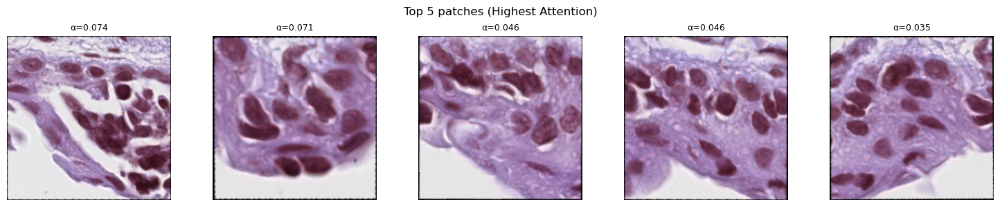

🔻 Least attended patches:


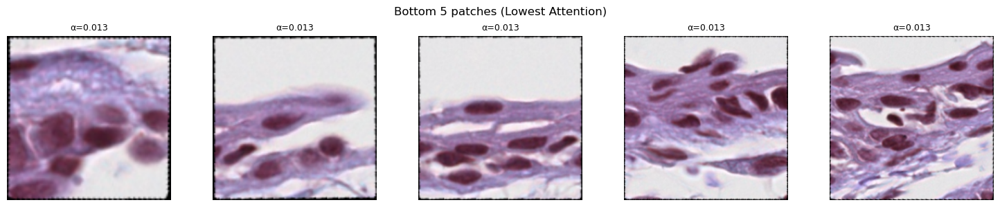


🧪 Case #12 | ID=97_ | True: 1 | Pred: 1 | Correct: True
🔝 Top attended patches:


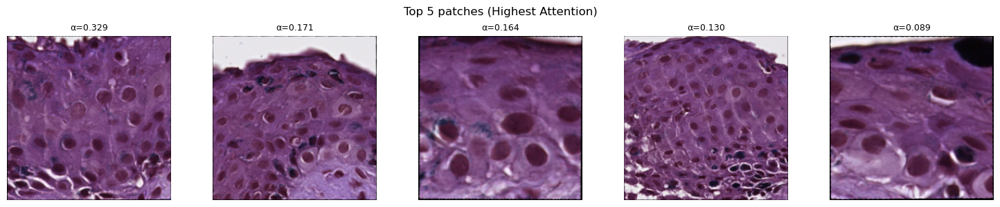

🔻 Least attended patches:


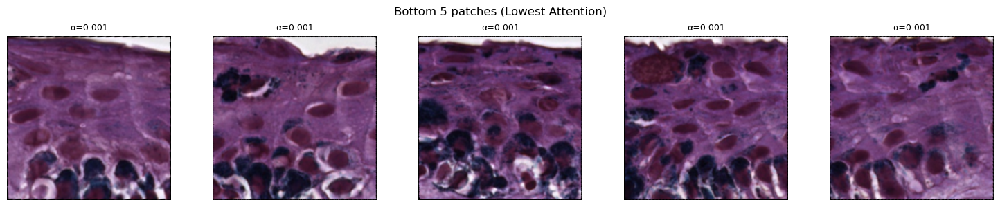


🧪 Case #5 | ID=34_ | True: 0 | Pred: 0 | Correct: True
🔝 Top attended patches:


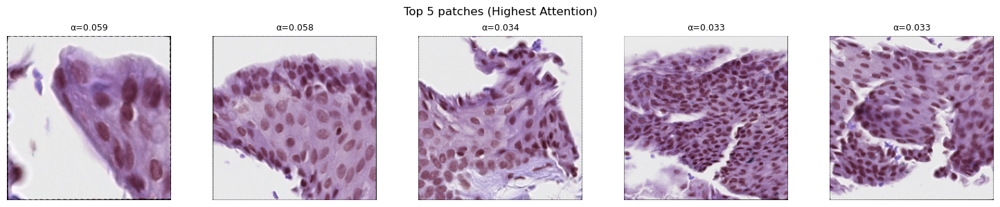

🔻 Least attended patches:


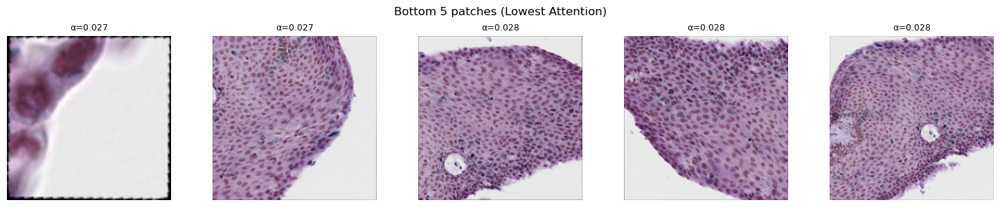


🧪 Case #0 | ID=30_ | True: 0 | Pred: 0 | Correct: True
🔝 Top attended patches:


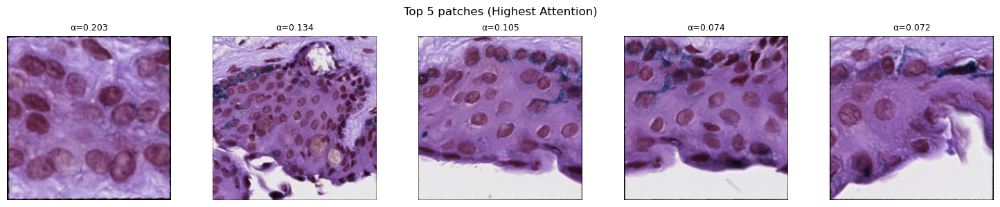

🔻 Least attended patches:


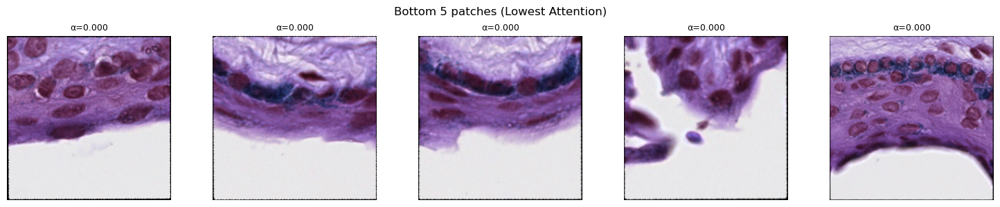


🧪 Case #16 | ID=1_u | True: 1 | Pred: 1 | Correct: True
🔝 Top attended patches:


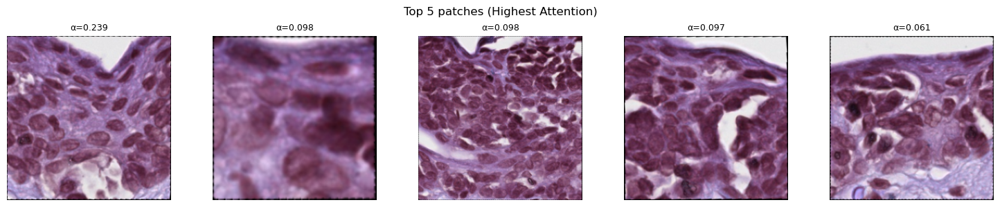

🔻 Least attended patches:


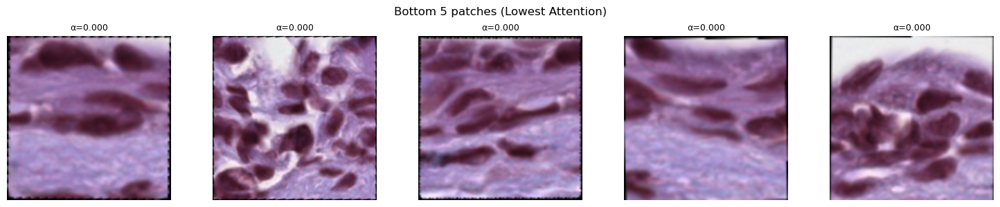

In [20]:
visualize_top_attended_patches(model, test_ds, num_cases=5, top_k=5, bottom_k=5)
